In [37]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('..')

import sys
from pathlib import Path

project_root = Path.cwd().parent
sys.path.insert(0, str(project_root))


import torch
from tqdm import tqdm 
import random 
import cv2 as cv
import os
import numpy as np 
import matplotlib.pyplot as plt

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [38]:
path = "../data/sample"

images_path = [path + "/images" + "/" + x  for x in  sorted(os.listdir(path + "/images"))][1:]
masks_path = [path + "/masks" + "/" + x for x in  sorted(os.listdir(path + "/masks"))][1:]

print(images_path[0], masks_path[0])
len(images_path) == len(masks_path)

../data/sample/images/AMD_image0.png ../data/sample/masks/AMD_mask0.png


True

In [39]:
images = [cv.imread(x,0) for x in images_path] 
masks = [cv.imread(x,0) for x in masks_path] 

In [40]:
assert len(images)==len(masks)
combined = list(zip(images,masks))
random.shuffle(combined)

all_images, all_masks = zip(*combined)

In [41]:
from src.dataset import OCTSegmentation, get_train_augs, get_test_augs
from src.config import cfg

In [42]:
DEVICE  = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
BATCH_SIZE = cfg['batch_size']
LR = cfg['lr']
EPOCHS = cfg['epochs']
ENCODER = cfg['encoder']
ENCODER_WEIGHTS = cfg['weights']
RESIZE = cfg['resize']

In [43]:
trainset = OCTSegmentation(images[:80],masks[:80],get_train_augs(RESIZE))
testset = OCTSegmentation(images[80:],masks[80:],get_train_augs(RESIZE))

In [44]:
dloader_train = torch.utils.data.DataLoader(trainset,batch_size=BATCH_SIZE,shuffle=True)
dloader_test = torch.utils.data.DataLoader(testset,batch_size=BATCH_SIZE,shuffle=False)

In [45]:
iterator = iter(dloader_train)
images, masks = next(iterator)

In [46]:
print(images.shape,masks.shape)

torch.Size([8, 1, 512, 512]) torch.Size([8, 1, 512, 512])


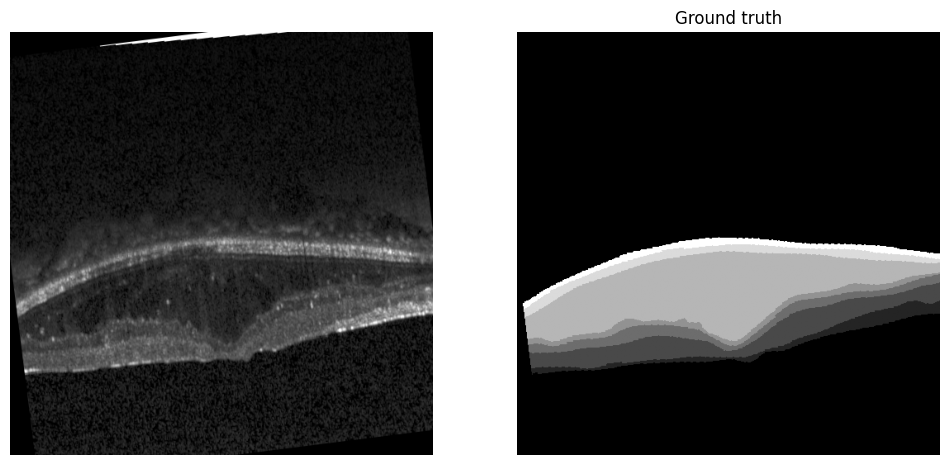

In [47]:
def show_images(dloader):
  iterator = iter(dloader)
  images,masks = next(iterator)

  #images -> torch.Size([8,1,256,256])

  i = np.random.randint(0,images.shape[0])
  images = images[i,:,:,:]
  #images -> torch.Size([1,256,256])

  image = images.numpy().transpose([1,2,0]) #torch.Size([256,256,1])

  masks = masks[i,:,:,:]
  mask = masks.numpy().transpose([1,2,0])

  fig, axs = plt.subplots(nrows=1,ncols=2,figsize=(12,6))

  axs[0].imshow(image, cmap='gray')
  # axs[0].set_title('Image :'+os.path.basename(image_paths[i]))
  axs[0].axis('off')

  axs[1].imshow(mask, cmap='gray')
  axs[1].set_title('Ground truth')
  axs[1].axis('off')

show_images(dloader_train)

In [48]:
from src.model import *
from src.train import *
from src.evaluate import *

model, loss, optimizer = create_model(cfg)


Début de l'entraînement: 2
Epochs: 25
Device: cpu
Nombre de classes: 7


--- Epoch 1/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.14s/it]


Train Loss: 0.7397 | Test Loss: 0.7650
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.7650)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


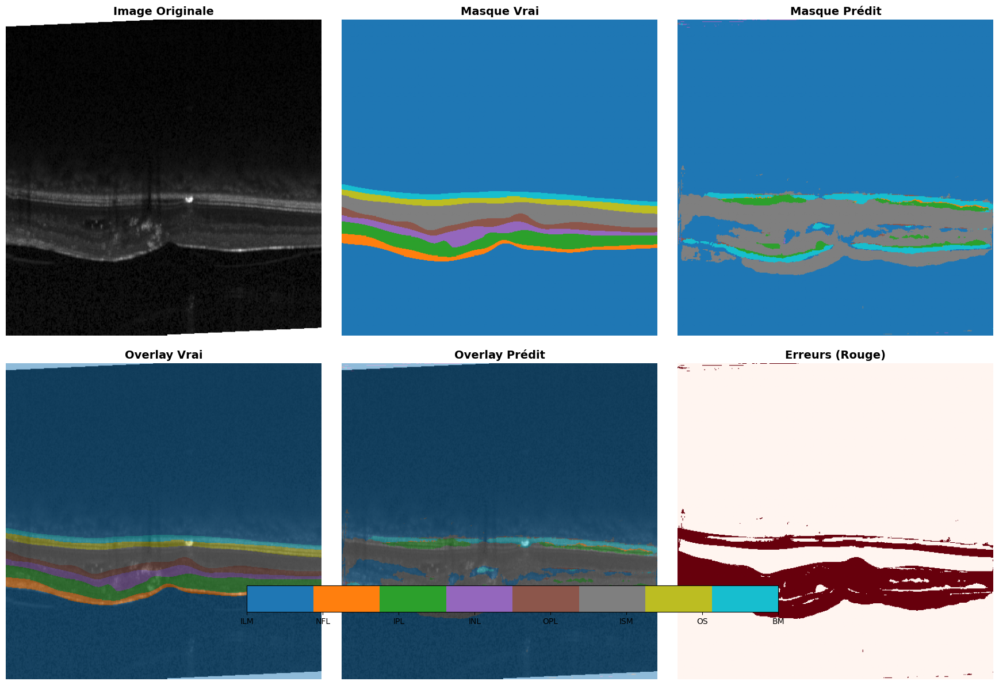

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 211886 | Précision:  95.6%
NFL        | Vrai:   4279 | Prédit:    316 | Précision:   0.1%
IPL        | Vrai:   9841 | Prédit:   4232 | Précision:  14.2%
INL        | Vrai:   5728 | Prédit:    228 | Précision:   0.3%
OPL        | Vrai:   4941 | Prédit:    536 | Précision:   3.1%
ISM        | Vrai:  13745 | Prédit:  37842 | Précision:  99.0%
OS         | Vrai:   5195 | Prédit:      0 | Précision:   0.0%
BM         | Vrai:   4262 | Prédit:   7104 | Précision:  57.1%
Learning Rate: 0.001000

--- Epoch 2/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.15s/it]


Train Loss: 0.4162 | Test Loss: 0.3874
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.3874)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


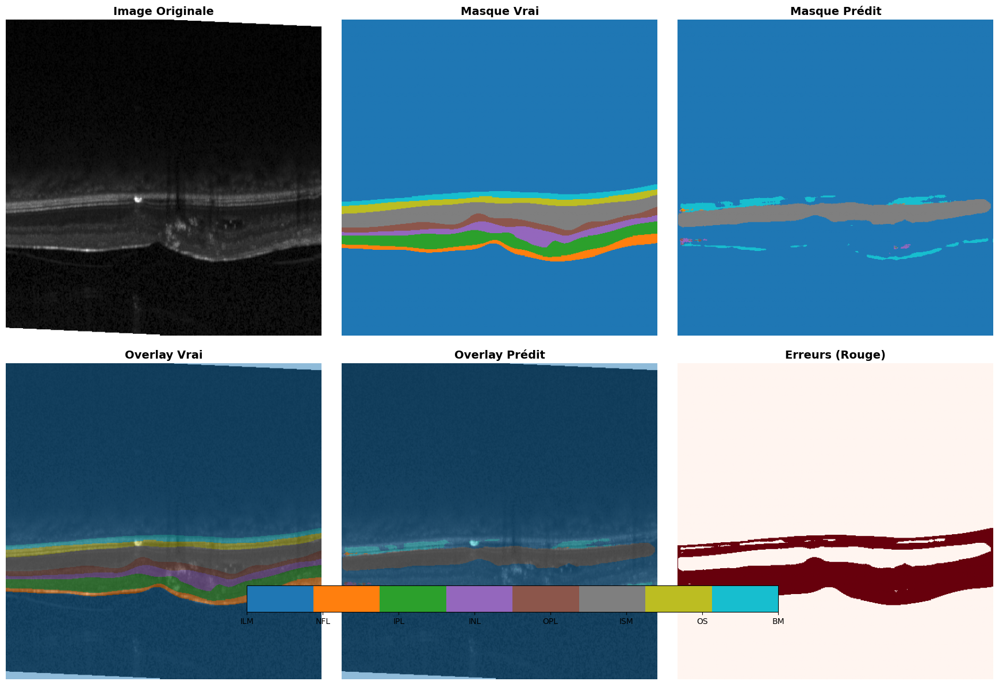

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 244453 | Précision: 100.0%
NFL        | Vrai:   4279 | Prédit:     47 | Précision:   0.0%
IPL        | Vrai:   9841 | Prédit:     14 | Précision:   0.1%
INL        | Vrai:   5728 | Prédit:    210 | Précision:   0.0%
OPL        | Vrai:   4941 | Prédit:     52 | Précision:   0.0%
ISM        | Vrai:  13745 | Prédit:  13300 | Précision:  90.0%
OS         | Vrai:   5195 | Prédit:      3 | Précision:   0.1%
BM         | Vrai:   4262 | Prédit:   4065 | Précision:  18.2%
Learning Rate: 0.001000

--- Epoch 3/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.12s/it]


Train Loss: 0.2790 | Test Loss: 0.3021
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.3021)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


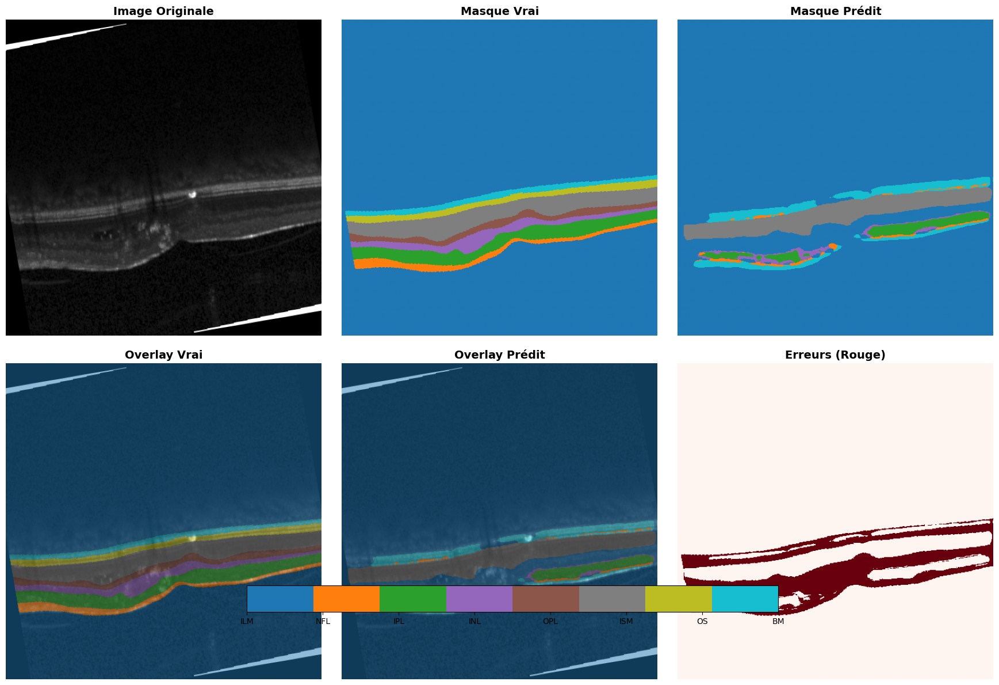

--------------------------------------------------
ILM        | Vrai: 214871 | Prédit: 231467 | Précision: 100.0%
NFL        | Vrai:   4189 | Prédit:   1587 | Précision:   7.1%
IPL        | Vrai:   9640 | Prédit:   4261 | Précision:  43.5%
INL        | Vrai:   5666 | Prédit:   2032 | Précision:   5.3%
OPL        | Vrai:   4853 | Prédit:      0 | Précision:   0.0%
ISM        | Vrai:  13561 | Prédit:  14330 | Précision:  92.2%
OS         | Vrai:   5133 | Prédit:      0 | Précision:   0.0%
BM         | Vrai:   4231 | Prédit:   8467 | Précision:  50.9%
Learning Rate: 0.001000

--- Epoch 4/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.10s/it]


Train Loss: 0.2188 | Test Loss: 0.2253
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.2253)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


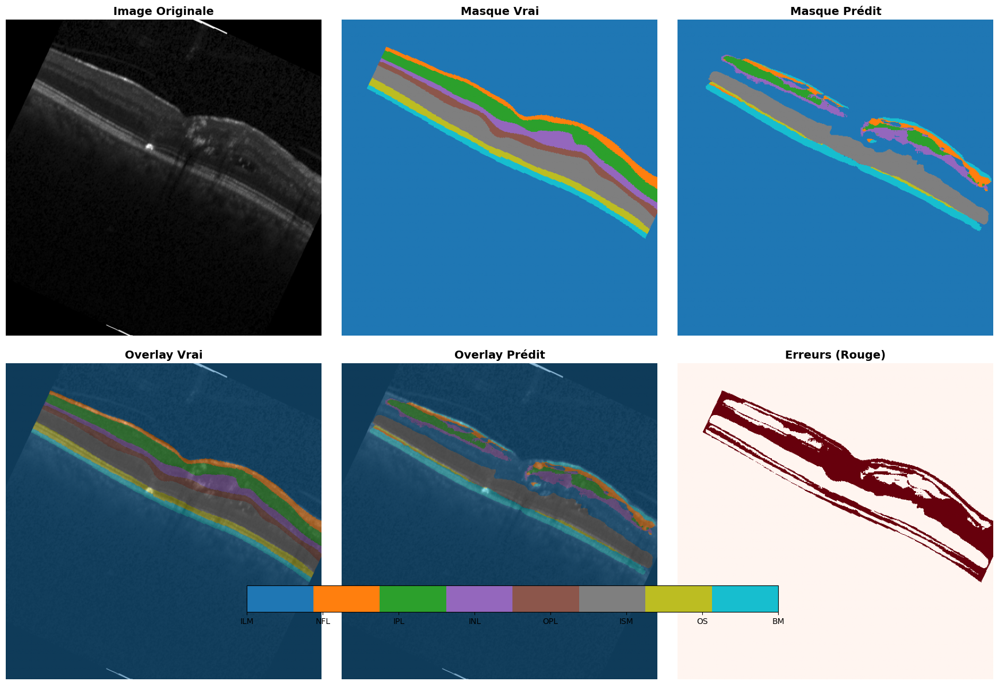

--------------------------------------------------
ILM        | Vrai: 214752 | Prédit: 230192 | Précision: 100.0%
NFL        | Vrai:   3954 | Prédit:   2635 | Précision:  32.0%
IPL        | Vrai:   9615 | Prédit:   3450 | Précision:  35.0%
INL        | Vrai:   5691 | Prédit:   4095 | Précision:  25.3%
OPL        | Vrai:   4942 | Prédit:      6 | Précision:   0.0%
ISM        | Vrai:  13740 | Prédit:  13913 | Précision:  89.2%
OS         | Vrai:   5198 | Prédit:   1094 | Précision:  20.3%
BM         | Vrai:   4252 | Prédit:   6759 | Précision:  65.9%
Learning Rate: 0.001000

--- Epoch 5/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.13s/it]


Train Loss: 0.1826 | Test Loss: 0.1868
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.1868)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


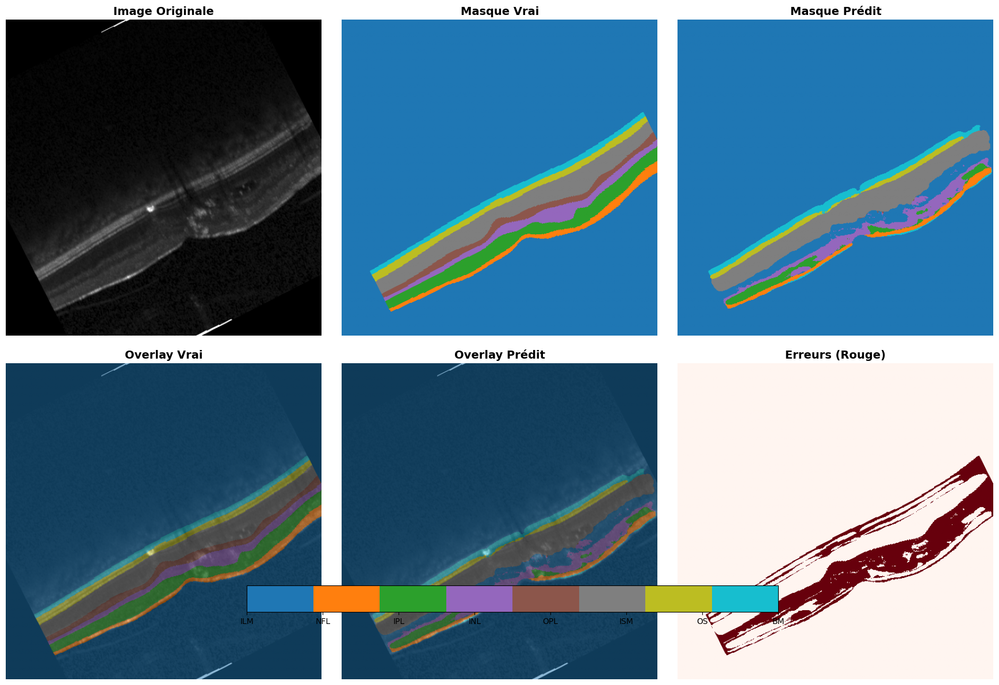

--------------------------------------------------
ILM        | Vrai: 214708 | Prédit: 226184 | Précision: 100.0%
NFL        | Vrai:   3967 | Prédit:   2895 | Précision:  59.1%
IPL        | Vrai:   9642 | Prédit:   2969 | Précision:  29.4%
INL        | Vrai:   5703 | Prédit:   6130 | Précision:  12.2%
OPL        | Vrai:   4945 | Prédit:     29 | Précision:   0.3%
ISM        | Vrai:  13738 | Prédit:  16038 | Précision:  94.9%
OS         | Vrai:   5186 | Prédit:   3032 | Précision:  52.2%
BM         | Vrai:   4255 | Prédit:   4867 | Précision:  54.0%
Learning Rate: 0.001000

--- Epoch 6/25 ---


Evaluation: 100%|██████████| 4/4 [00:13<00:00,  3.27s/it]


Train Loss: 0.1604 | Test Loss: 0.1429
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.1429)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


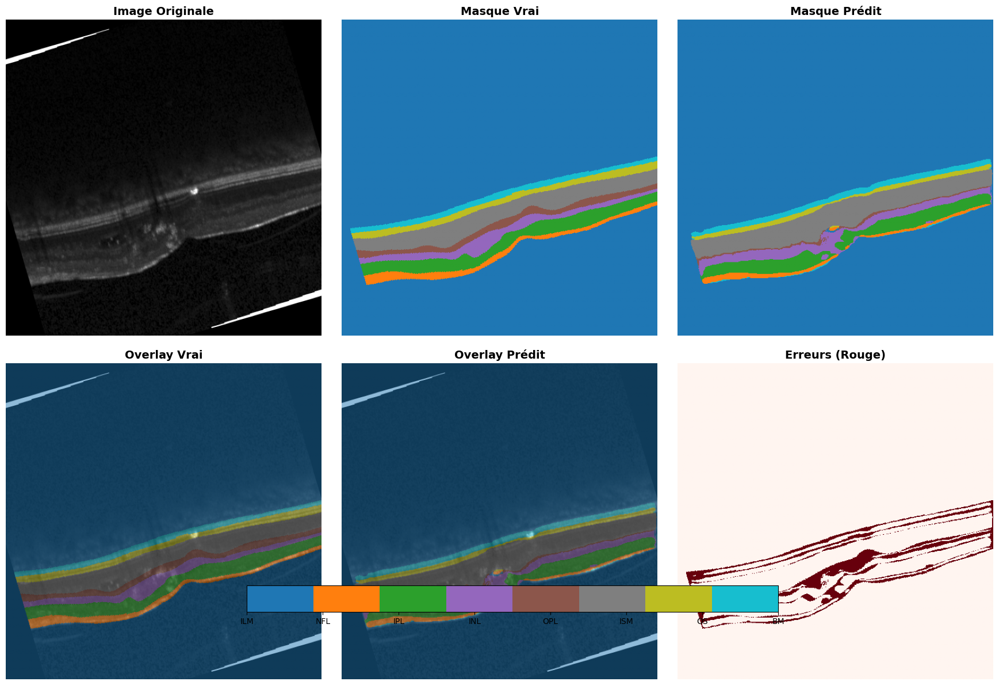

--------------------------------------------------
ILM        | Vrai: 215033 | Prédit: 218053 | Précision: 100.0%
NFL        | Vrai:   4158 | Prédit:   2517 | Précision:  52.5%
IPL        | Vrai:   9555 | Prédit:   9170 | Précision:  84.3%
INL        | Vrai:   5652 | Prédit:   6743 | Précision:  71.0%
OPL        | Vrai:   4832 | Prédit:   1315 | Précision:  15.9%
ISM        | Vrai:  13524 | Prédit:  16507 | Précision:  97.8%
OS         | Vrai:   5137 | Prédit:   3219 | Précision:  58.2%
BM         | Vrai:   4253 | Prédit:   4620 | Précision:  61.8%
Learning Rate: 0.001000

--- Epoch 7/25 ---


Evaluation: 100%|██████████| 4/4 [00:17<00:00,  4.45s/it]


Train Loss: 0.1430 | Test Loss: 0.1417
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.1417)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


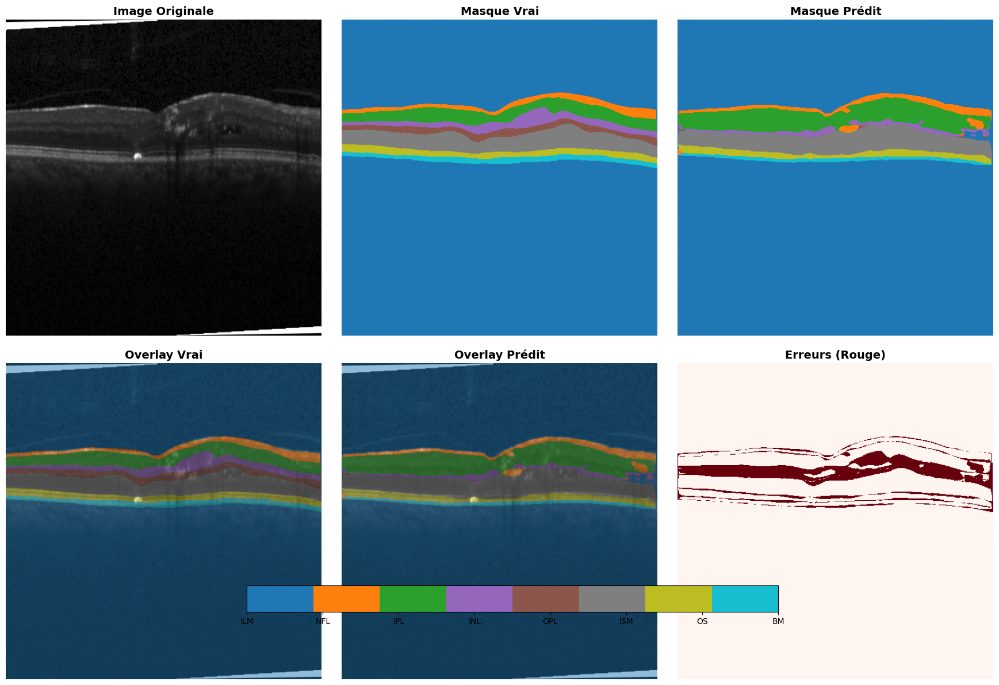

--------------------------------------------------
ILM        | Vrai: 214248 | Prédit: 216244 | Précision: 100.0%
NFL        | Vrai:   4268 | Prédit:   4381 | Précision:  76.7%
IPL        | Vrai:   9812 | Prédit:  15638 | Précision:  91.5%
INL        | Vrai:   5721 | Prédit:   2849 | Précision:  16.3%
OPL        | Vrai:   4934 | Prédit:    148 | Précision:   1.7%
ISM        | Vrai:  13726 | Prédit:  15493 | Précision:  94.7%
OS         | Vrai:   5181 | Prédit:   4715 | Précision:  72.8%
BM         | Vrai:   4254 | Prédit:   2676 | Précision:  61.4%
Learning Rate: 0.001000

--- Epoch 8/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.17s/it]


Train Loss: 0.1314 | Test Loss: 0.1145
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.1145)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


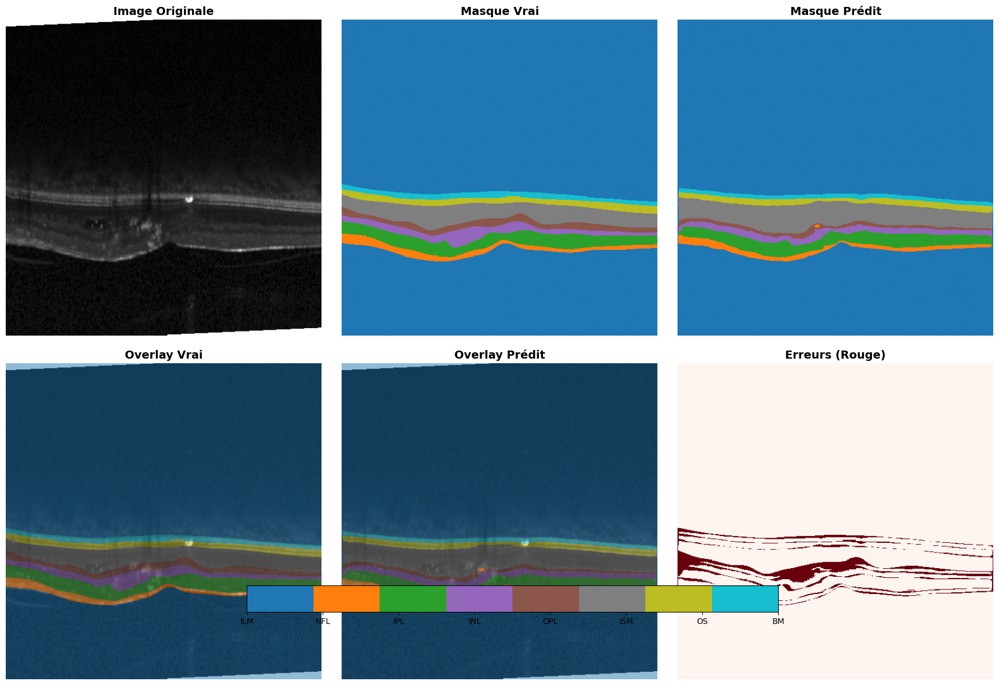

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 215949 | Précision: 100.0%
NFL        | Vrai:   4279 | Prédit:   3741 | Précision:  75.8%
IPL        | Vrai:   9841 | Prédit:   9482 | Précision:  87.9%
INL        | Vrai:   5728 | Prédit:   4903 | Précision:  63.9%
OPL        | Vrai:   4941 | Prédit:   2720 | Précision:  28.7%
ISM        | Vrai:  13745 | Prédit:  17305 | Précision:  98.6%
OS         | Vrai:   5195 | Prédit:   4590 | Précision:  82.4%
BM         | Vrai:   4262 | Prédit:   3454 | Précision:  70.6%
Learning Rate: 0.001000

--- Epoch 9/25 ---


Evaluation: 100%|██████████| 4/4 [00:13<00:00,  3.27s/it]


Train Loss: 0.1183 | Test Loss: 0.1101
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.1101)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


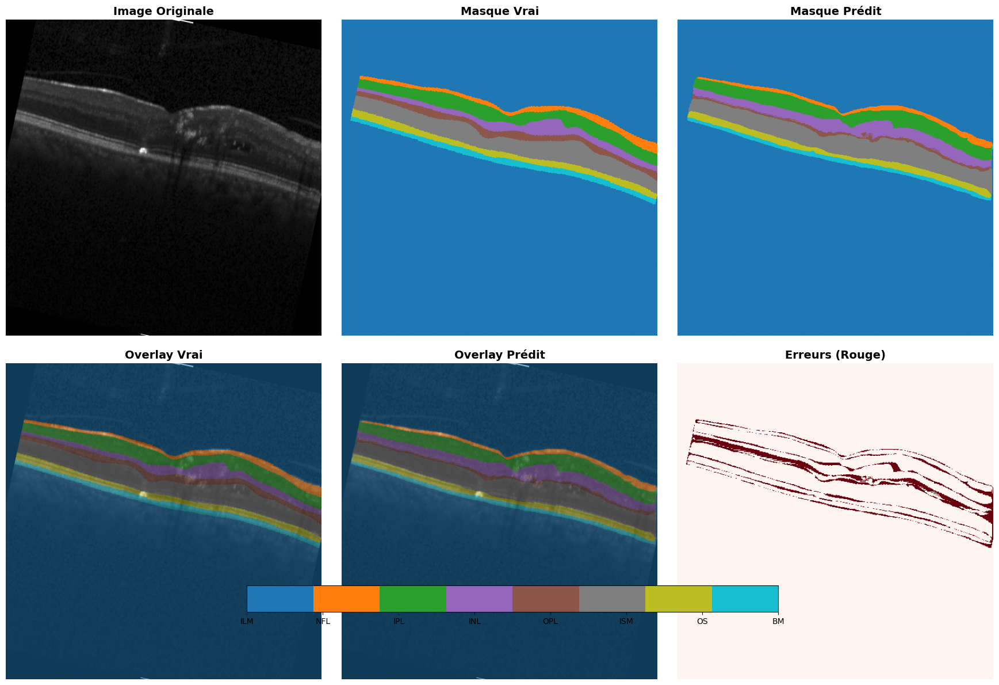

--------------------------------------------------
ILM        | Vrai: 214843 | Prédit: 215987 | Précision:  99.9%
NFL        | Vrai:   4031 | Prédit:   3051 | Précision:  69.8%
IPL        | Vrai:   9610 | Prédit:  10190 | Précision:  92.6%
INL        | Vrai:   5640 | Prédit:   8215 | Précision:  87.7%
OPL        | Vrai:   4865 | Prédit:   2152 | Précision:  29.4%
ISM        | Vrai:  13703 | Prédit:  14341 | Précision:  94.1%
OS         | Vrai:   5189 | Prédit:   4983 | Précision:  83.8%
BM         | Vrai:   4263 | Prédit:   3225 | Précision:  71.9%
Learning Rate: 0.001000

--- Epoch 10/25 ---


Evaluation: 100%|██████████| 4/4 [00:13<00:00,  3.34s/it]


Train Loss: 0.1056 | Test Loss: 0.1085
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.1085)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


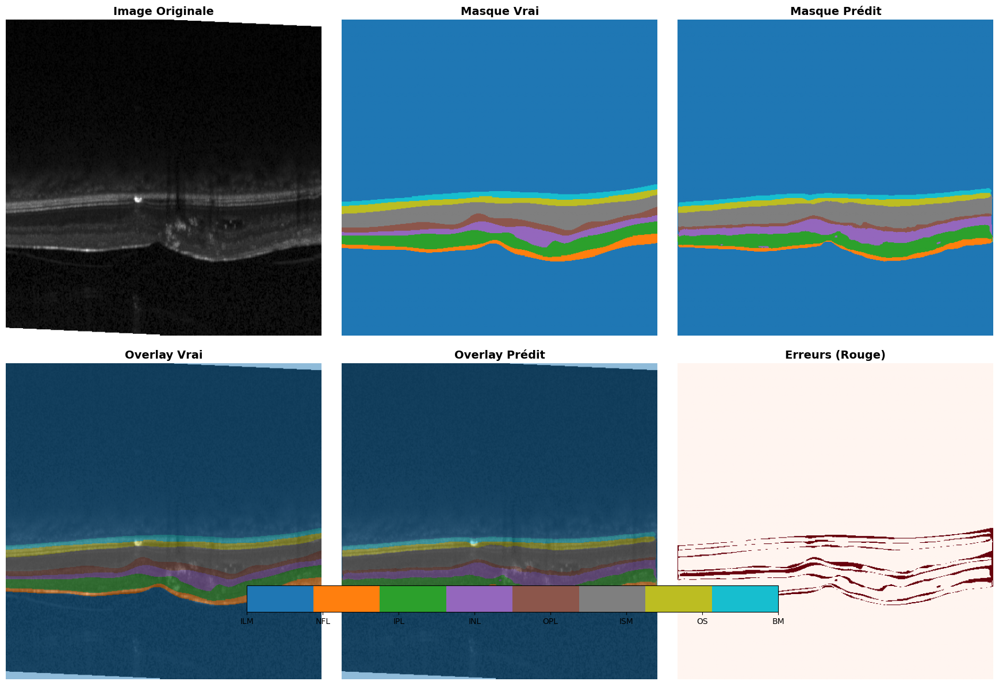

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 216041 | Précision: 100.0%
NFL        | Vrai:   4279 | Prédit:   3025 | Précision:  66.2%
IPL        | Vrai:   9841 | Prédit:   9800 | Précision:  89.2%
INL        | Vrai:   5728 | Prédit:   7897 | Précision:  93.5%
OPL        | Vrai:   4941 | Prédit:   2682 | Précision:  45.9%
ISM        | Vrai:  13745 | Prédit:  14422 | Précision:  95.6%
OS         | Vrai:   5195 | Prédit:   4632 | Précision:  82.8%
BM         | Vrai:   4262 | Prédit:   3645 | Précision:  73.0%
Learning Rate: 0.001000

--- Epoch 11/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.17s/it]


Train Loss: 0.1005 | Test Loss: 0.0912
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.0912)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


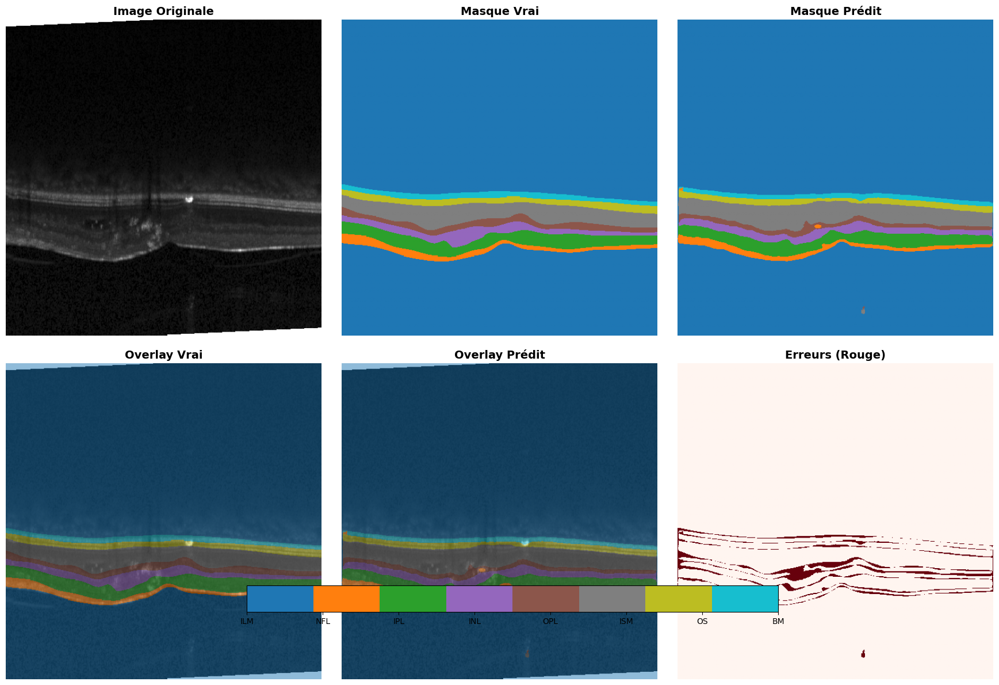

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 215654 | Précision:  99.9%
NFL        | Vrai:   4279 | Prédit:   3997 | Précision:  78.1%
IPL        | Vrai:   9841 | Prédit:   9562 | Précision:  89.5%
INL        | Vrai:   5728 | Prédit:   5557 | Précision:  75.5%
OPL        | Vrai:   4941 | Prédit:   3815 | Précision:  55.6%
ISM        | Vrai:  13745 | Prédit:  15300 | Précision:  96.8%
OS         | Vrai:   5195 | Prédit:   4524 | Précision:  81.8%
BM         | Vrai:   4262 | Prédit:   3735 | Précision:  78.0%
Learning Rate: 0.001000

--- Epoch 12/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.22s/it]


Train Loss: 0.0958 | Test Loss: 0.1035
Learning Rate: 0.001000

--- Epoch 13/25 ---


Evaluation: 100%|██████████| 4/4 [00:13<00:00,  3.26s/it]


Train Loss: 0.0909 | Test Loss: 0.0860
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.0860)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


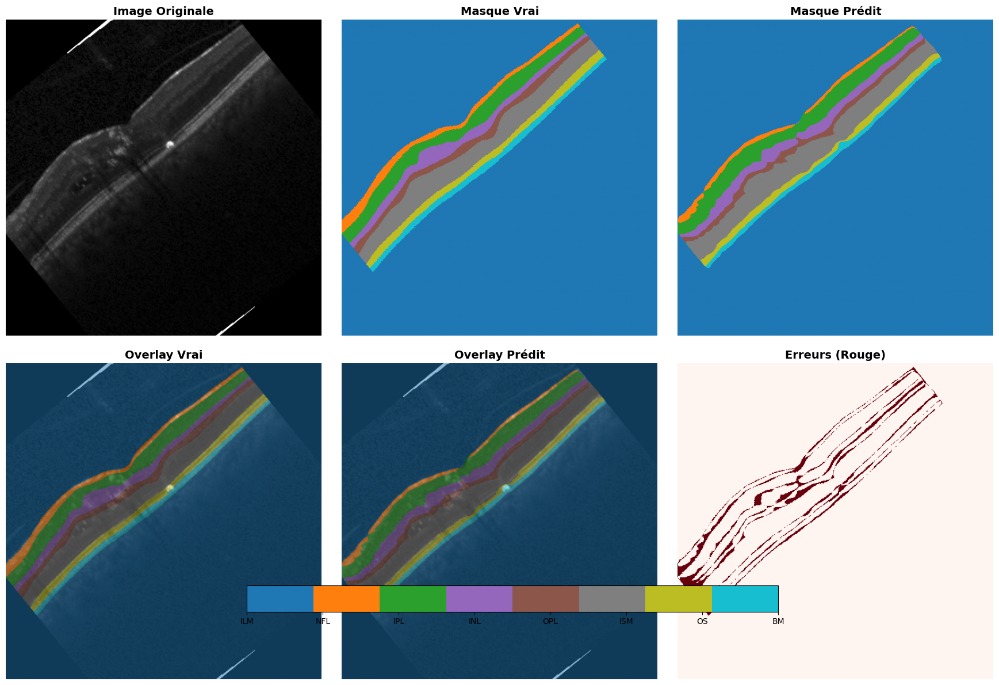

--------------------------------------------------
ILM        | Vrai: 214253 | Prédit: 215539 | Précision:  99.9%
NFL        | Vrai:   4175 | Prédit:   2622 | Précision:  58.5%
IPL        | Vrai:   9845 | Prédit:  10829 | Précision:  91.5%
INL        | Vrai:   5723 | Prédit:   6485 | Précision:  82.0%
OPL        | Vrai:   4936 | Prédit:   4053 | Précision:  58.0%
ISM        | Vrai:  13757 | Prédit:  14888 | Précision:  94.5%
OS         | Vrai:   5192 | Prédit:   4390 | Précision:  76.2%
BM         | Vrai:   4263 | Prédit:   3338 | Précision:  68.9%
Learning Rate: 0.001000

--- Epoch 14/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.25s/it]


Train Loss: 0.0831 | Test Loss: 0.0763
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.0763)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


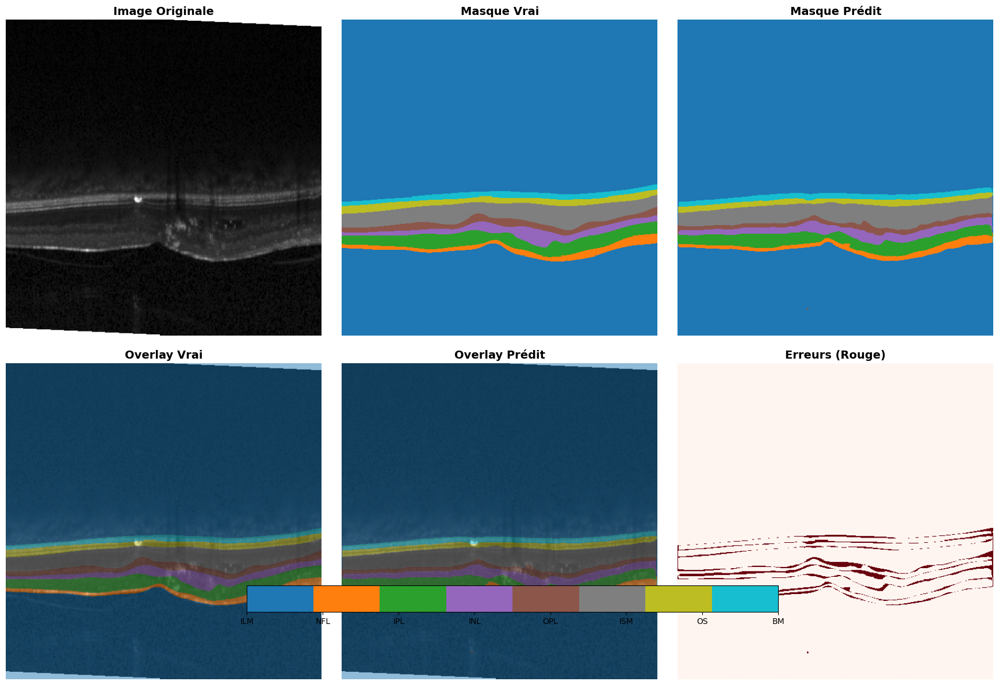

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 215604 | Précision: 100.0%
NFL        | Vrai:   4279 | Prédit:   3977 | Précision:  78.6%
IPL        | Vrai:   9841 | Prédit:   9205 | Précision:  88.0%
INL        | Vrai:   5728 | Prédit:   6094 | Précision:  82.9%
OPL        | Vrai:   4941 | Prédit:   3860 | Précision:  61.4%
ISM        | Vrai:  13745 | Prédit:  14515 | Précision:  95.7%
OS         | Vrai:   5195 | Prédit:   4485 | Précision:  80.3%
BM         | Vrai:   4262 | Prédit:   4404 | Précision:  84.6%
Learning Rate: 0.001000

--- Epoch 15/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.16s/it]


Train Loss: 0.0787 | Test Loss: 0.0794
Learning Rate: 0.001000

--- Epoch 16/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.05s/it]


Train Loss: 0.0791 | Test Loss: 0.0769
Learning Rate: 0.001000

--- Epoch 17/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.11s/it]


Train Loss: 0.0770 | Test Loss: 0.0707
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.0707)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


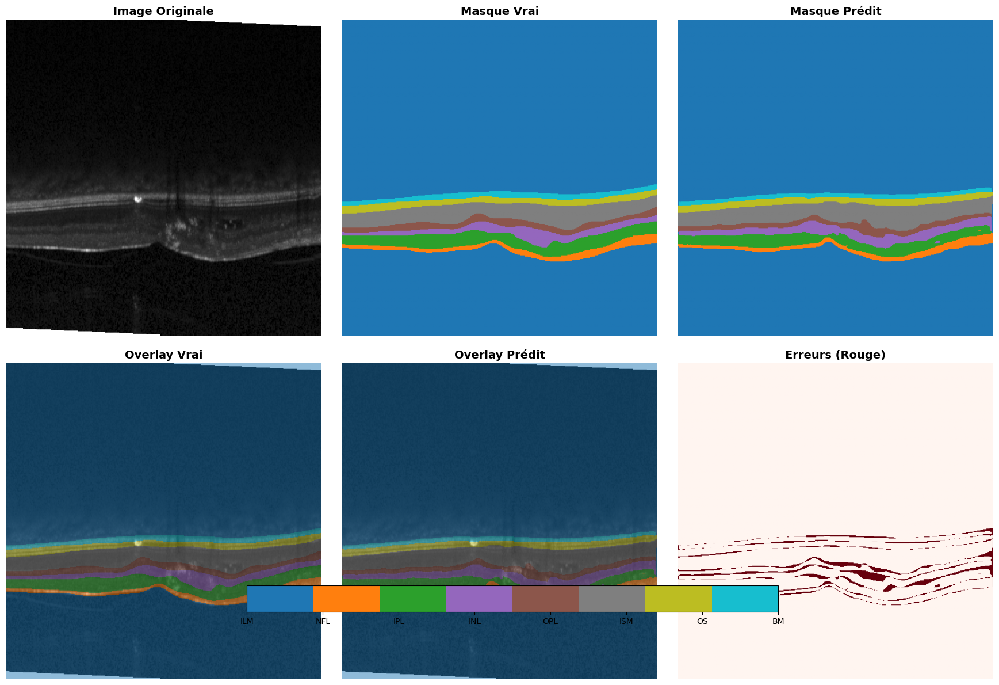

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 215259 | Précision:  99.9%
NFL        | Vrai:   4279 | Prédit:   4067 | Précision:  83.5%
IPL        | Vrai:   9841 | Prédit:   8453 | Précision:  82.9%
INL        | Vrai:   5728 | Prédit:   6577 | Précision:  82.5%
OPL        | Vrai:   4941 | Prédit:   4502 | Précision:  66.7%
ISM        | Vrai:  13745 | Prédit:  14594 | Précision:  96.3%
OS         | Vrai:   5195 | Prédit:   5235 | Précision:  89.9%
BM         | Vrai:   4262 | Prédit:   3457 | Précision:  76.5%
Learning Rate: 0.001000

--- Epoch 18/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.17s/it]


Train Loss: 0.0760 | Test Loss: 0.0776
Learning Rate: 0.001000

--- Epoch 19/25 ---


Evaluation: 100%|██████████| 4/4 [00:13<00:00,  3.31s/it]


Train Loss: 0.0742 | Test Loss: 0.0723
Learning Rate: 0.001000

--- Epoch 20/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.09s/it]


Train Loss: 0.0724 | Test Loss: 0.0774
Learning Rate: 0.001000

--- Epoch 21/25 ---


Evaluation: 100%|██████████| 4/4 [00:16<00:00,  4.05s/it]


Train Loss: 0.0747 | Test Loss: 0.0861
Learning Rate: 0.001000

--- Epoch 22/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.15s/it]


Train Loss: 0.0726 | Test Loss: 0.0862
Learning Rate: 0.001000

--- Epoch 23/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.19s/it]


Train Loss: 0.0678 | Test Loss: 0.0697
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.0697)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


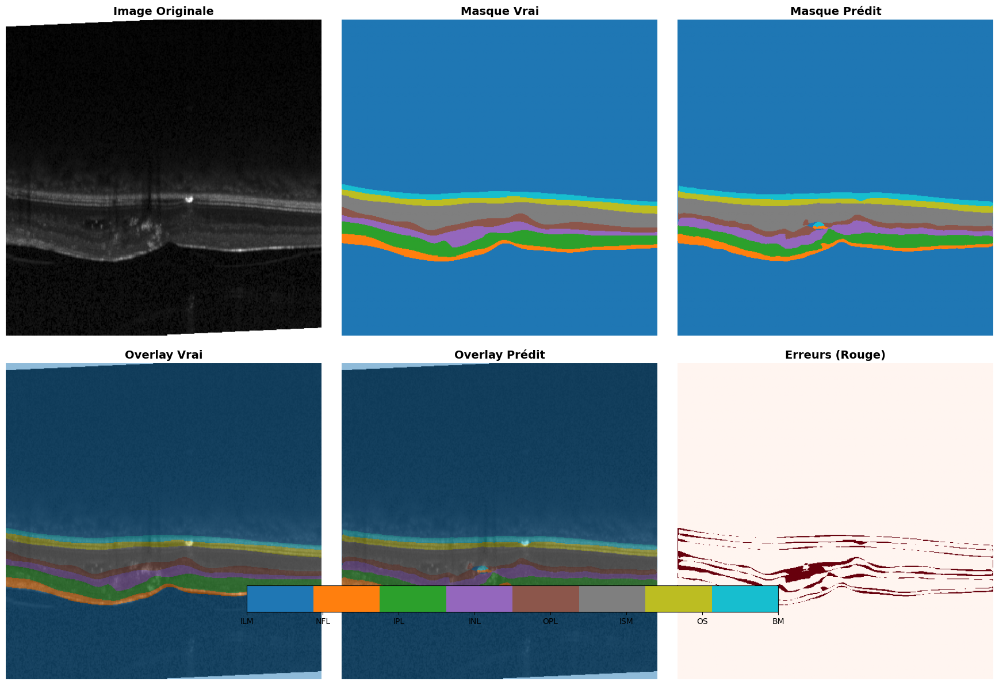

--------------------------------------------------
ILM        | Vrai: 214153 | Prédit: 215215 | Précision:  99.9%
NFL        | Vrai:   4279 | Prédit:   4020 | Précision:  79.6%
IPL        | Vrai:   9841 | Prédit:   8391 | Précision:  82.0%
INL        | Vrai:   5728 | Prédit:   6361 | Précision:  79.2%
OPL        | Vrai:   4941 | Prédit:   4224 | Précision:  60.9%
ISM        | Vrai:  13745 | Prédit:  14519 | Précision:  95.5%
OS         | Vrai:   5195 | Prédit:   4812 | Précision:  85.3%
BM         | Vrai:   4262 | Prédit:   4602 | Précision:  88.6%
Learning Rate: 0.001000

--- Epoch 24/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.06s/it]


Train Loss: 0.0686 | Test Loss: 0.0617
✅ MODÈLE SAUVEGARDÉ (Test Loss: 0.0617)
Génération des visualisations...


/Users/anessad/Documents/PROJETS/OCT-AMD-SEGMENTATION/src/train.py:94: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


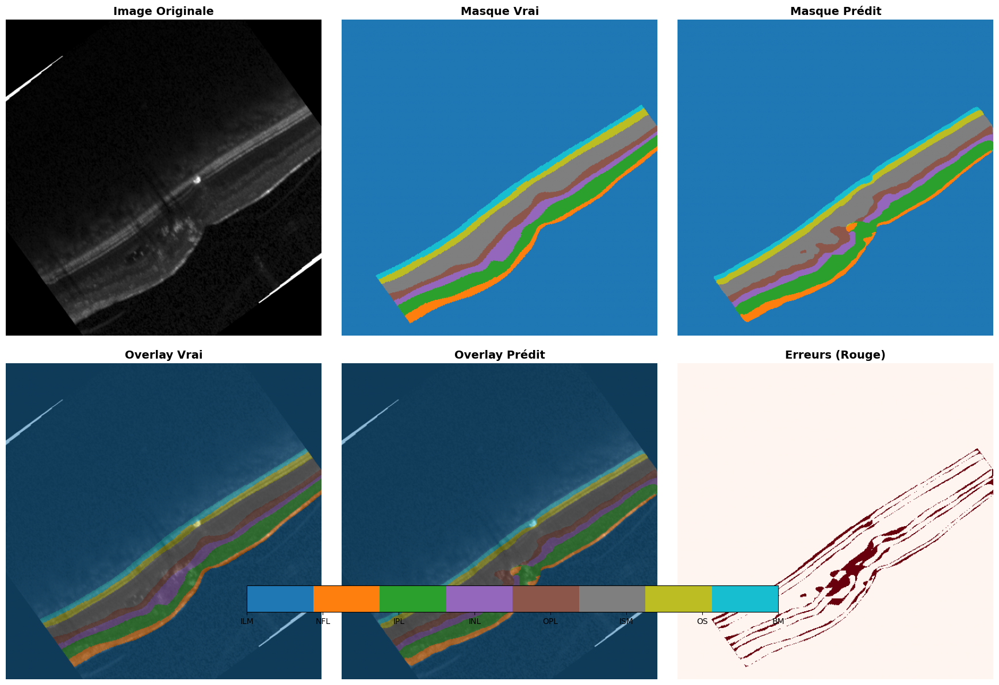

--------------------------------------------------
ILM        | Vrai: 214516 | Prédit: 216191 | Précision:  99.9%
NFL        | Vrai:   4167 | Prédit:   3521 | Précision:  73.5%
IPL        | Vrai:   9629 | Prédit:  10327 | Précision:  93.2%
INL        | Vrai:   5698 | Prédit:   4632 | Précision:  65.5%
OPL        | Vrai:   4934 | Prédit:   5272 | Précision:  68.7%
ISM        | Vrai:  13740 | Prédit:  13982 | Précision:  91.9%
OS         | Vrai:   5196 | Prédit:   4840 | Précision:  83.8%
BM         | Vrai:   4264 | Prédit:   3379 | Précision:  66.9%
Learning Rate: 0.001000

--- Epoch 25/25 ---


Evaluation: 100%|██████████| 4/4 [00:12<00:00,  3.05s/it]

Train Loss: 0.0621 | Test Loss: 0.0637
Learning Rate: 0.001000

Entraînement terminé!
Meilleure Test Loss: 0.0617
Modèle sauvegardé dans: ../models/2



In [56]:
training_loss, testing_loss = training(cfg,"../models", "2", dloader_train, dloader_test, model, optimizer, loss )

In [57]:
def plot_metrics(working_dir, experiment_name, training_loss, test_loss, config):

  num_epoch = config['epochs']
  save_dir = os.path.join(working_dir,experiment_name)
  os.makedirs(save_dir, exist_ok= True)


  #Modifier la font size par défaut
  plt.rcParams.update({'font.size' : 14})

  fig, ax = plt.subplots(figsize=(10,6))

  ax.plot(range(num_epoch),training_loss, color='red', label='Train loss')
  ax.plot(range(num_epoch),test_loss, color='blue', label='Test loss')
  ax.legend()
  ax.set_title('All loss')
  ax.set_xlabel('Epoch')
  ax.set_ylabel('Loss')

  plt.tight_layout()
  plt.savefig(os.path.join(save_dir,'loss.png'))
  plt.show()

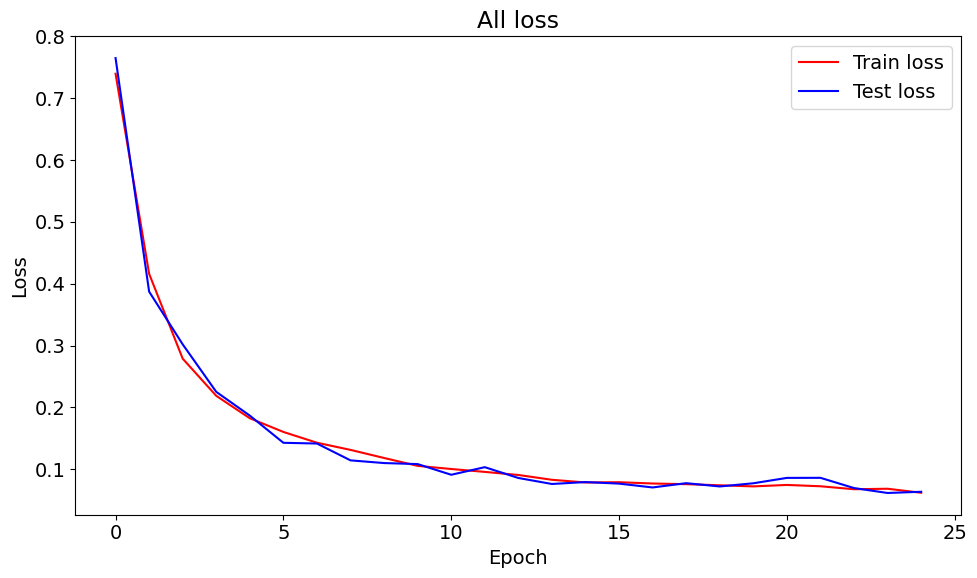

<Figure size 640x480 with 0 Axes>

In [58]:
plot_metrics('./resuts', 'simu', training_loss, testing_loss, cfg)
plt.savefig("../docs/loss2.png")